In [ ]:
from IPython.display import Audio
import soundfile as sf
import random

audio, text = random.choice(samples)
sf.write("sample.wav", audio, 16000)

print("Text Transcription:", text, "\nAudio:")
Audio(filename="sample.wav")

Text Transcription: OUR CONFIDENCE OR LACK OF CONFIDENCE IN THE ACCURACY OF A MEMORY IMAGE MUST IN FUNDAMENTAL CASES BE BASED UPON A CHARACTERISTIC OF THE IMAGE ITSELF SINCE WE CANNOT EVOKE THE PAST BODILY AND COMPARE IT WITH THE PRESENT IMAGE 
Audio:


In [ ]:
!pip install datasets
!pip install transformers
!pip install jiwer
!pip install noisify

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 21.5 MB/s eta 0:00:00


In [ ]:
from datasets import load_dataset
librispeech_eval = load_dataset("lj_speech", "main", split="train")

In [ ]:
import numpy as np
from datasets import load_dataset  # Assuming you've loaded the dataset using datasets.load_dataset

def delete_segments(audio_array, deletion_prob=0.1, segment_length=10000):
    # Calculate the number of segments to potentially delete
    num_segments = len(audio_array) // segment_length
    segments_to_delete = np.random.choice(num_segments, int(num_segments * deletion_prob), replace=False)

    # Delete selected segments
    for segment_idx in segments_to_delete:
        start_idx = segment_idx * segment_length
        end_idx = min(start_idx + segment_length, len(audio_array))
        audio_array[start_idx:end_idx] = np.NAN  # Replace the segment with zeros

    return audio_array

# Apply segment deletion to all audio arrays in the dataset
# deletion_probability = 0.5  # Adjust deletion probability as needed
# for entry in librispeech_eval["audio"]:
#     entry['array'] = delete_segments(entry['array'], deletion_prob=deletion_probability)


In [ ]:
def increase_wer(dataset, deletion_rate_increase):
    noise_level=0
    for example in dataset:
        # Simulate deletion by gradually increasing the deletion rate
        deletion_rate = deletion_rate_increase * np.random.rand()  # Randomly increase deletion rate
        # Apply deletion operation to the audio data of the example
        example['audio'] = delete_segments(example['audio'], deletion_prob=deletion_rate)

    return dataset

In [ ]:
from datasets import load_dataset
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor
import torch
from jiwer import wer
for i in range(1,10):
    librispeech_eval = load_dataset("lj_speech", "main", split="train")
    noise_level = i*10  # Adjust the noise level as needed
    for entry in librispeech_eval["audio"]:
        entry['array'] = generate_complex_noise(entry['array'], noise_level)
    deletion_probability = i/10  # Adjust deletion probability as needed
    # Load the LibriSpeech dataset
    #librispeech_eval = load_dataset("librispeech_asr", "clean", split="test")
    librispeech_eval1 = librispeech_eval.select(range(1000))
    increase_wer(librispeech_eval1, deletion_probability)
    # Load the Wav2Vec2 model and processor
    model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base").to("cuda")
    processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base")

    # Define a function to process audio data and generate transcriptions
    def map_to_pred(batch):
        transcriptions = []
        for audio_data in batch['audio']:
            input_values = processor(audio_data['array'],sampling_rate=16000, return_tensors="pt", padding="longest").input_values
            with torch.no_grad():
                logits = model(input_values.to("cuda")).logits

            predicted_ids = torch.argmax(logits, dim=-1)
            transcription = processor.batch_decode(predicted_ids)
            transcriptions.append(transcription)

        batch["transcription"] = transcriptions
        return batch

    # Apply the function to generate transcriptions
    result = librispeech_eval1.map(map_to_pred, batched=True, batch_size=1)

    # Calculate and print the Word Error Rate (WER)
    wer_scores = [wer(ref, trans) for ref, trans in zip(result["text"], result["transcription"])]
    overall_wer = sum(wer_scores) / len(wer_scores)
    print("Overall WER:", overall_wer)


config.json:   0%|          | 0.00/1.84k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/configuration_utils.py:381: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/380M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

Parameter 'function'=<function map_to_pred at 0x7b3b5914e0e0> of the transform datasets.arrow_dataset.Dataset._map_single couldn't be hashed properly, a random hash was used instead. Make sure your transforms and parameters are serializable with pickle or dill for the dataset fingerprinting and caching to work. If you reuse this transform, the caching mechanism will consider it to be different from the previous calls and recompute everything. This warning is only showed once. Subsequent hashing failures won't be showed.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0003982174688058


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0073369342860443


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0067987600336825


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0


Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['lm_head.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

Overall WER: 1.0110661791167208


In [ ]:
from datasets import load_dataset
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor
import torch
from jiwer import wer
for i in range(1,10):
    librispeech_eval = load_dataset("lj_speech", "main", split="train")
    deletion_probability = i/10  # Adjust deletion probability as needed
    # Load the LibriSpeech dataset
    #librispeech_eval = load_dataset("librispeech_asr", "clean", split="test")
    librispeech_eval1 = librispeech_eval.select(range(100))
    increase_wer(librispeech_eval1, deletion_probability)
    # Load the Wav2Vec2 model and processor
    model = Wav2Vec2ForCTC.from_pretrained("facebook/hubert-base-ls960").to("cuda")
    processor = Wav2Vec2Processor.from_pretrained("facebook/hubert-large-ls960-ft")

    # Define a function to process audio data and generate transcriptions
    def map_to_pred(batch):
        transcriptions = []
        for audio_data in batch['audio']:
            input_values = processor(audio_data['array'],sampling_rate=16000, return_tensors="pt", padding="longest").input_values
            with torch.no_grad():
                logits = model(input_values.to("cuda")).logits

            predicted_ids = torch.argmax(logits, dim=-1)
            transcription = processor.batch_decode(predicted_ids)
            transcriptions.append(transcription)

        batch["transcription"] = transcriptions
        return batch

    # Apply the function to generate transcriptions
    result = librispeech_eval1.map(map_to_pred, batched=True, batch_size=1)

    # Calculate and print the Word Error Rate (WER)
    wer_scores = [wer(ref, trans) for ref, trans in zip(result["text"], result["transcription"])]
    overall_wer = sum(wer_scores) / len(wer_scores)
    print("Overall WER:", overall_wer)


config.json:   0%|          | 0.00/1.39k [00:00<?, ?B/s]

You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.


pytorch_model.bin:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/212 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/138 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.38k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.01


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0259090909090909


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0663494357809375


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.0302527472527472


You are using a model of type hubert to instantiate a model of type wav2vec2. This is not supported for all configurations of models and can yield errors.
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.005


In [ ]:
from datasets import load_dataset
from transformers import HubertForCTC, Wav2Vec2Processor
import torch
from jiwer import wer
librispeech_eval1 = librispeech_eval.select(range(100))
# Load the HuBERT model and processor
model1 = HubertForCTC.from_pretrained("facebook/hubert-base-ls960").to("cuda")
processor1 = Wav2Vec2Processor.from_pretrained("facebook/hubert-large-ls960-ft")
model1.to("cuda")
# Define a function to process audio data and generate transcriptions
def map_to_pred(batch):
  transcriptions = []
  for audio_data in batch['audio']:
    input_values = processor1(audio_data['array'],sampling_rate=16000, return_tensors="pt", padding="longest").input_values
    with torch.no_grad():
      logits = model1(input_values.to("cuda")).logits

    predicted_ids = torch.argmax(logits, dim=-1)
    transcription = processor.batch_decode(predicted_ids)
    transcriptions.append(transcription)

  batch["transcription"] = transcriptions
  return batch

# Apply the function to generate transcriptions
result = librispeech_eval1.map(map_to_pred, batched=True, batch_size=1)

# Calculate and print the Word Error Rate (WER)
wer_scores = [wer(ref, trans) for ref, trans in

zip(result["text"], result["transcription"])]
overall_wer = sum(wer_scores) / len(wer_scores)
print("Overall WER:", overall_wer)

Some weights of HubertForCTC were not initialized from the model checkpoint at facebook/hubert-base-ls960 and are newly initialized: ['encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'lm_head.weight', 'lm_head.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Map:   0%|          | 0/100 [00:00<?, ? examples/s]

Overall WER: 1.01


In [ ]:
librispeech_eval['audio']

[{'path': '/root/.cache/huggingface/datasets/downloads/extracted/e0f3d50e856945385982ba36b58615b72eef9b2ba5a2565bdcc225b70f495eed/6930-75918-0000.flac',
  'array': array([-6.10351562e-05,  9.15527344e-05,  1.06811523e-03, ...,
         -2.19726562e-03, -1.13830566e-02, -8.81958008e-03]),
  'sampling_rate': 16000},
 {'path': '/root/.cache/huggingface/datasets/downloads/extracted/e0f3d50e856945385982ba36b58615b72eef9b2ba5a2565bdcc225b70f495eed/6930-75918-0001.flac',
  'array': array([-0.00570679, -0.00732422,  0.00512695, ...,  0.00085449,
          0.0007019 ,  0.00067139]),
  'sampling_rate': 16000},
 {'path': '/root/.cache/huggingface/datasets/downloads/extracted/e0f3d50e856945385982ba36b58615b72eef9b2ba5a2565bdcc225b70f495eed/6930-75918-0002.flac',
  'array': array([ 0.00091553,  0.00115967,  0.0010376 , ...,  0.00531006,
         -0.00634766, -0.00198364]),
  'sampling_rate': 16000},
 {'path': '/root/.cache/huggingface/datasets/downloads/extracted/e0f3d50e856945385982ba36b58615b72ee

In [ ]:
!pip install torchaudio

In [ ]:
!pip install pesq pystoi

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for pesq: filename=pesq-0.0.4-cp310-cp310-linux_x86_64.whl size=262741 sha256=86581b143c22896fc137c481d288235b04440176ca35c891c1f9e4643ae2fc64
  Stored in directory: /root/.cache/pip/wheels/c5/4e/2c/251524370c0fdd659e99639a0fbd0ca5a782c3aafcd456b28d
  Created wheel for pystoi: filename=pystoi-0.3.3-py2.py3-none-any.whl size=7778 sha256=598381c09c9fdc20a33c373c32d182ec15bdf0064c254d64ac8a3b61b4ab0d25
  Stored in directory: /root/.cache/pip/wheels/3b/ca/9e/5b5d6e5e109322303b50d21918ad2bd7d50a2a0775c11e08e8
Successfully built pesq pystoi


In [ ]:
librispeech_eval

Dataset({
    features: ['file', 'audio', 'text', 'speaker_id', 'chapter_id', 'id'],
    num_rows: 2620
})

In [ ]:
import torchaudio
import torch
import numpy as np

def calculate_snr(audio):
    """
    Calculate the Signal-to-Noise Ratio (SNR) of an audio clip.
    """
    audio_tensor = torch.from_numpy(audio)
    signal_power = torch.mean(audio_tensor ** 2)

    # Apply VAD (Voice Activity Detection)
    vad = torchaudio.transforms.Vad(sample_rate=16000)(audio_tensor)

    # Ensure that the VAD output and audio have compatible dimensions
    vad = vad[:len(audio)]
    audio_tensor = audio_tensor[:len(vad)]

    noise_power = torch.mean((audio_tensor * (1 - vad)) ** 2)

    snr = 10 * torch.log10(signal_power / noise_power)
    return snr.item()

# Extract audio arrays from the dataset
audio_arrays = [example['array'] for example in librispeech_eval['audio']]

# Calculate SNR for each audio clip
snr_values = []
for audio in audio_arrays:
    snr = calculate_snr(audio)
    snr_values.append(snr)

# You can now analyze the SNR values as needed
mean_snr = np.mean(snr_values)
min_snr = np.min(snr_values)
max_snr = np.max(snr_values)

print(f"Mean SNR: {mean_snr} dB")
print(f"Min SNR: {min_snr} dB")
print(f"Max SNR: {max_snr} dB")


Mean SNR: -0.30883536376552706 dB
Min SNR: -1.2912623026889918 dB
Max SNR: 2.2497301669630936 dB


In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.7/493.7 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 36.6 MB/s eta 0:00:00


In [ ]:
import torch
import numpy as np

In [ ]:
torch.cuda.is_available()

True

In [ ]:
# from datasets import load_dataset
# librispeech_eval = load_dataset("librispeech_asr", "clean", split="test")

In [ ]:
# def add_noise(audio_array, noise_level=0.1):
#     # Calculate the standard deviation based on the noise level
#     audio_std = np.std(audio_array)
#     noise = np.random.normal(0, audio_std * noise_level, len(audio_array))
#     noisy_audio = audio_array + noise
#     return noisy_audio

# # Add noise to each audio array in the dataset
# noise_level = 15  # Adjust the noise level as needed
# for entry in librispeech_eval["audio"]:
#     entry['array'] = add_noise(entry['array'], noise_level)

In [ ]:
import numpy as np
import scipy.signal as signal

def generate_complex_noise(audio_array, noise_level=0.1):
    # Calculate the standard deviation based on the noise level
    audio_std = np.std(audio_array)

    # Generate Gaussian noise
    gaussian_noise = np.random.normal(0, audio_std * noise_level, len(audio_array))

    # Generate pink noise
    pink_noise = np.random.randn(len(audio_array))
    pink_noise = signal.lfilter([1, 0.7], [1], pink_noise)
    pink_noise *= audio_std * noise_level * 0.5

    # Generate impulse noise (random spikes)
    impulse_noise = np.zeros(len(audio_array))
    num_spikes = int(len(audio_array) * noise_level * 0.1)  # Adjust spike count
    spike_indices = np.random.randint(0, len(audio_array), num_spikes)
    impulse_noise[spike_indices] = np.random.normal(0, audio_std * noise_level, num_spikes)

    # Combine different types of noise
    combined_noise = 0.4 * gaussian_noise + 0.3 * pink_noise + 0.3 * impulse_noise

    # Add the combined noise to the original audio array
    noisy_audio = audio_array + combined_noise
    return noisy_audio

# noise_level = 50  # Adjust the noise level as needed
# for entry in librispeech_eval["audio"]:
#     entry['array'] = generate_complex_noise(entry['array'], noise_level)

In [ ]:
from datasets import load_dataset
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor
import torch
from jiwer import wer

# Load the LibriSpeech dataset
#librispeech_eval = load_dataset("librispeech_asr", "clean", split="test")

# Load the Wav2Vec2 model and processor
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h").to("cuda")
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")

# Define a function to process audio data and generate transcriptions
def map_to_pred(batch):
    transcriptions = []
    for audio_data in batch['audio']:
        input_values = processor(audio_data['array'],sampling_rate=16000, return_tensors="pt", padding="longest").input_values
        with torch.no_grad():
            logits = model(input_values.to("cuda")).logits

        predicted_ids = torch.argmax(logits, dim=-1)
        transcription = processor.batch_decode(predicted_ids)
        transcriptions.append(transcription)

    batch["transcription"] = transcriptions
    return batch

# Apply the function to generate transcriptions
result = librispeech_eval.map(map_to_pred, batched=True, batch_size=1)

# Calculate and print the Word Error Rate (WER)
wer_scores = [wer(ref, trans) for ref, trans in zip(result["text"], result["transcription"])]
overall_wer = sum(wer_scores) / len(wer_scores)
print("Overall WER:", overall_wer)


Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_v', 'wav2vec2.encoder.pos_conv_embed.conv.weight_g']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You sho

Map:   0%|          | 0/2620 [00:00<?, ? examples/s]

Overall WER: 0.03825904128930885


In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.7/311.7 kB 13.3 MB/s eta 0:00:00


In [ ]:
from datasets import load_dataset
librispeech_eval = load_dataset("birgermoell/Italian_Parkinsons_Voice_and_Speech", "main", split="train")

Resolving data files:   0%|          | 0/833 [00:00<?, ?it/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
librispeech_eval

Dataset({
    features: ['audio'],
    num_rows: 1662
})

In [ ]:
librispeech_eval['audio']

[{'path': '/root/.cache/huggingface/datasets/downloads/6abefacd5b60c4deeea77dadb8f645e68b92222334dc443f22eb2797acb1d4ee',
  'array': array([0.        , 0.        , 0.        , ..., 0.0039978 , 0.00350952,
         0.00344849]),
  'sampling_rate': 16000},
 {'path': '/root/.cache/huggingface/datasets/downloads/4fa1c234743b2fb6c86516db924f6c461389f4d70982ac38a3d67f7c79c0e7ec',
  'array': array([0.00000000e+00, 0.00000000e+00, 3.05175781e-05, ...,
         8.23974609e-04, 1.58691406e-03, 1.43432617e-03]),
  'sampling_rate': 16000},
 {'path': '/root/.cache/huggingface/datasets/downloads/8bee970e2d76b95b60166e623d9e41db296d0ec8b7d047df9c131ba2359315f4',
  'array': array([0.        , 0.        , 0.        , ..., 0.00460815, 0.0043335 ,
         0.00408936]),
  'sampling_rate': 16000},
 {'path': '/root/.cache/huggingface/datasets/downloads/c75551847fd985ffb474acad040db96cf68d235a518203ec936589a5eff8ae29',
  'array': array([ 0.        ,  0.        ,  0.        , ..., -0.00128174,
         -0.00

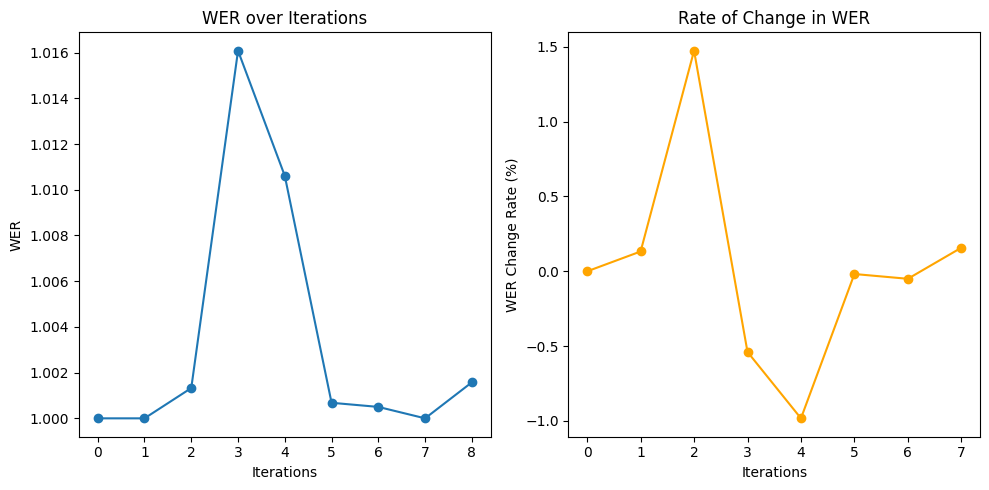

Average Rate of Change in WER: 0.02%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# WER values
wer_values = [1.0, 1.0, 1.001325, 1.0160837601266306, 1.0106086029138768, 1.0006807692307693, 1.0005, 1.0, 1.0015755494505494]

# Calculate the rate of change in WER
wer_array = np.array(wer_values)
wer_change_rate = np.diff(wer_array) / wer_array[:-1] * 100  # Calculate rate of change in percentage

# Plot WER values
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(wer_values, marker='o', linestyle='-')
plt.xlabel('Iterations')
plt.ylabel('WER')
plt.title('WER over Iterations')

# Plot rate of change in WER
plt.subplot(1, 2, 2)
plt.plot(wer_change_rate, marker='o', linestyle='-', color='orange')
plt.xlabel('Iterations')
plt.ylabel('WER Change Rate (%)')
plt.title('Rate of Change in WER')

plt.tight_layout()
plt.show()

# Print the average rate of change in WER
avg_wer_change_rate = np.mean(wer_change_rate)
print(f"Average Rate of Change in WER: {avg_wer_change_rate:.2f}%")


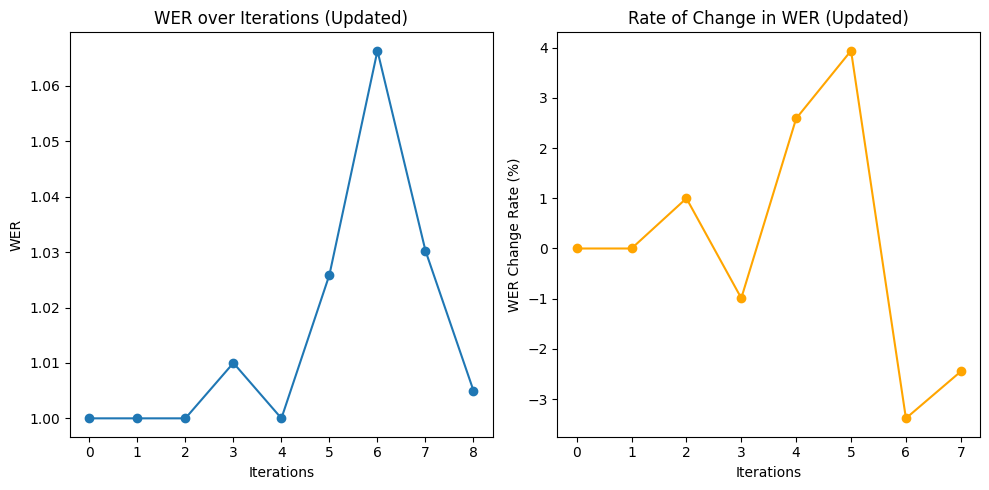

Average Rate of Change in WER (Updated): 0.09%


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Updated WER values
wer_values_updated = [1.0, 1.0, 1.0, 1.01, 1.0, 1.0259090909090909, 1.0663494357809375, 1.0302527472527472, 1.005]

# Calculate the rate of change in WER
wer_array_updated = np.array(wer_values_updated)
wer_change_rate_updated = np.diff(wer_array_updated) / wer_array_updated[:-1] * 100  # Calculate rate of change in percentage

# Plot updated WER values
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(wer_values_updated, marker='o', linestyle='-')
plt.xlabel('Iterations')
plt.ylabel('WER')
plt.title('WER over Iterations (Updated)')

# Plot updated rate of change in WER
plt.subplot(1, 2, 2)
plt.plot(wer_change_rate_updated, marker='o', linestyle='-', color='orange')
plt.xlabel('Iterations')
plt.ylabel('WER Change Rate (%)')
plt.title('Rate of Change in WER (Updated)')

plt.tight_layout()
plt.show()

# Print the average rate of change in WER
avg_wer_change_rate_updated = np.mean(wer_change_rate_updated)
print(f"Average Rate of Change in WER (Updated): {avg_wer_change_rate_updated:.2f}%")
